# Imports

In [1]:
from imutils import contours
import numpy as np
import argparse
import imutils
import cv2
import sys
from matplotlib import pyplot as plt

## Dictionary FIRST_NUMBER , which maps the first digit to the corresponding credit card type.

In [2]:
# define a dictionary that maps the first digit of a credit card
# number to the credit card type
FIRST_NUMBER = {
	"3": "American Express",
	"4": "Visa",
	"5": "MasterCard",
	"6": "Discover Card"
}

EXPECTED_PAN_DIGITS = 16  

### List of all The Test cases 

In [3]:
testcases = [
    './testcases/00 - Credit_Card_blank.jpg',
    './testcases/01 - Straightforward.jpg',
    './testcases/02 - You can do it.jpg',
    './testcases/03 - Should be okay.jpg',
    './testcases/04 - Still ok, I hope.jpg',
    './testcases/05 - Looks cool, hope it runs cool too.jpg',
    './testcases/06 - Hatetlewe7 hatlewe7.jpg',
    './testcases/07 - Hatet3eweg hat3eweg.jpg',
    './testcases/08 - Ew3a soba3ak ya3am.jpg',
    './testcases/09 - El spero spathis we23et 3aaaa.jpg',
    './testcases/10 - Mal7 w Felfel.jpg',
    './testcases/11 - Ya setty ew3i.jpg',
    './testcases/12 - weewooweewoo.jpg',
    './testcases/13 - Matozbot el camera ya Kimo.jpg',
    './testcases/14 - 2el noor 2ata3.jpg',
    './testcases/15 - Compresso Espresso.jpg',
    './testcases/16 - Sheel el kart yastaaaa.jpg',
]



## Kernels


In [4]:
# Sharpen the image using a filter
sharpening_kernel1 = np.array([[0, -1, 0],
                                  [-1, 5,-1],
                                  [0, -1, 0]])

# Define the sharpening kernel
sharpening_kernel2 = np.array([[-1, -1, -1],
                              [-1,  9, -1],
                              [-1, -1, -1]])


# structuring kernel
rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 3))
# Create a smaller rectangular structuring element with size 5x2
smallRectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 2))

sqKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
smallsqKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1))


## Utils Function


### Show Images Plot 


In [5]:
def show_images(images, titles):
    plt.figure(figsize=(15, 5))
    for i, (imageplace, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        # imageplace = cv2.cvtColor(imageplace, cv2.COLOR_BGR2GRAY)
        plt.imshow(imageplace   , cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Load The refrence OCR-A image
### - Converting to Greyscale
###  - Thesholding + inverting it

In [6]:
def load_digit_templates(ref_image_path):
    ref = cv2.imread(ref_image_path)
    ref = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
    ref = cv2.threshold(ref, 10, 255, cv2.THRESH_BINARY_INV)[1]
    refCnts = cv2.findContours(ref.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    refCnts = imutils.grab_contours(refCnts)
    refCnts = contours.sort_contours(refCnts, method="left-to-right")[0]
    digits = {}

    for (i, c) in enumerate(refCnts):
        (x, y, w, h) = cv2.boundingRect(c)
        roi = ref[y:y + h, x:x + w]
        roi = cv2.resize(roi, (57, 88))
        digits[i] = roi

    return digits

# Fix Functions 

## Check Rotation


### Order Points of the rectangle 

In [7]:
# Sort corners to identify top-left, top-right, bottom-right, bottom-left
def order_points(pts):
    rect = np.zeros((4, 2), dtype="float32")

    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    return rect

### Get card contour

In [8]:
def get_card_contour(image):
    # Find contours in the edges and filter out the card's contour
    contours, _ = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)  # Sort by area

    # Approximate the contour to a polygon and detect corners
    for contour in contours:
        epsilon = 0.02 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True)

        if len(approx) == 4:  # If the polygon has 4 vertices, we assume it's the card
            card_corners = approx
            break

    pts = card_corners.reshape(4, 2)
    rect = order_points(pts)

    return rect

## Check Rotation

In [9]:
def Check_Rotation(image , width=400, height=250):

    rect = get_card_contour(image)

    (tl, tr, br, bl) = rect

    # Calculate the angle of tilt based on the line between top-left and top-right corners
    angle = np.arctan2(tr[1] - tl[1], tr[0] - tl[0]) * 180.0 / np.pi

    # Check if the angle deviates significantly from 0 (horizontal)
    is_tilted = angle > 10  # You can adjust this threshold

    return is_tilted, angle

### Correct Rotation

In [10]:
def correct_rotation(edges_input, image_input, width=400, height=250):
    rect = get_card_contour(edges_input)

    # Define the target coordinates for the perspective warp
    dst = np.array([
        [0, 0],
        [width - 1, 0],
        [width - 1, height - 1],
        [0, height - 1]], dtype="float32")

    # Compute the perspective transform matrix and apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image_input, M, (width, height))

    return warped

## Fix Frequency of the image

In [11]:
def detect_and_remove_sin_noise(image_input):
    if len(image_input.shape) > 2:
        image_input = np.mean(image_input, axis=2)  # Convert to grayscale if necessary

    # Compute the 2D discrete Fourier Transform
    dft = np.fft.fft2(image_input)
    dft_shift = np.fft.fftshift(dft)  # Shift zero-frequency component to the center

    # Compute magnitude and phase spectra
    magnitude_spectrum = np.abs(dft_shift)
    phase_spectrum = np.angle(dft_shift)

    # Threshold for detecting peaks
    threshold = 0.157 * np.max(magnitude_spectrum)
    peaks = np.where(magnitude_spectrum > threshold)

    rows, cols = image_input.shape
    center_row, center_col = rows // 2, cols // 2
    frequencies = np.array(peaks) - np.array([[center_row], [center_col]])

    print("Detected sinusoidal noise frequencies, magnitudes, and phases:")
    for freq, mag, phase in zip(frequencies.T, magnitude_spectrum[peaks], phase_spectrum[peaks]):
        normalized_magnitude = mag / np.max(magnitude_spectrum)
        print(f"Frequency: ({freq[0]}, {freq[1]}) in pixels, Magnitude: {mag}, "
              f"Normalized Magnitude: {normalized_magnitude:.4f}, Phase: {phase:.4f} radians")

    # Define the central square to avoid removing frequencies within this region
    avoid_range = 1  # Define the range of the central square (±1 in both dimensions)

    filtered = False
    if len(frequencies[0]) > 0:
        for freq_row, freq_col in zip(frequencies[0], frequencies[1]):
            # Check if the frequency is within the avoid_range square
            if not (abs(freq_row) <= avoid_range and abs(freq_col) <= avoid_range):
                print(f"Removing frequency: ({freq_row}, {freq_col})")
                dft_shift[center_row + freq_row, center_col + freq_col] = 0
                dft_shift[center_row - freq_row, center_col - freq_col] = 0
                filtered = True

        # Remove adjacent pixels around the frequency to ensure complete removal
        for freq_row, freq_col in zip(frequencies[0], frequencies[1]):
            if not (abs(freq_row) <= avoid_range and abs(freq_col) <= avoid_range):
                for i in range(-1, 2):
                    for j in range(-1, 2):
                        x, y = center_row + freq_row + i, center_col + freq_col + j
                        if 0 <= x < rows and 0 <= y < cols:
                            dft_shift[x, y] = 0
                            dft_shift[center_row - freq_row - i, center_col - freq_col - j] = 0

    if filtered:
        # Inverse DFT to get the filtered image
        dft_unshifted = np.fft.ifftshift(dft_shift)
        filtered_image = np.fft.ifft2(dft_unshifted).real

        # Normalize the image
        img_back = cv2.normalize(filtered_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        # Post-processing
        img_back = cv2.GaussianBlur(img_back, (3, 3), 2)
        cv2.imwrite('testpys/filtered_image.jpg', img_back)
        return img_back, True
    else:
        print("No significant sinusoidal frequency detected. Skipping noise removal.")
        cv2.imwrite('testpys/filtered_image.jpg', image_input)

        return image_input, False

## Fix Salt and Pepper  of the image

In [12]:
def detect_salt_pepper_noise(img, threshold=0.1):

    # Convert image to float32 for precision
    img = img.astype(np.float32)

    # Define the kernel size for the median filter
    kernel_size = 3

    # Apply median filter to remove noise
    median_filtered = cv2.medianBlur(img, kernel_size)

    # Calculate the absolute difference between the original and median filtered images
    diff = np.abs(img - median_filtered)

    # Threshold the difference to detect noise
    # For salt-and-pepper noise, we expect large differences at noisy pixels
    noisy_pixels = diff > 0.5 * (np.max(img) - np.min(img))

    # Calculate the proportion of noisy pixels
    noise_proportion = np.sum(noisy_pixels) / np.prod(img.shape)

    # Determine if salt-and-pepper noise is present based on the threshold
    noise_type = "No Salt and Pepper Noise Detected"
    if noise_proportion > threshold:
        noise_type = "Salt and Pepper Noise Detected"

    return noise_type


In [13]:
def fix_salt_pepper_noise(img_input):
    # Apply Gaussian Blur to smooth the image and reduce noise
    blurred_image = cv2.GaussianBlur(img_input, (5, 5), 1)

    # Apply median blur to further reduce noise while preserving edges
    blurred_image = cv2.medianBlur(blurred_image, 3)
    
    # Apply fixed thresholding
    _, binary_image = cv2.threshold(blurred_image, 100, 255, cv2.THRESH_BINARY_INV)
    
    morphed_image = binary_image
    
    # Apply morphological operations to clean up the image
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))  # Smaller kernel to preserve details
    morphed_image = cv2.morphologyEx(morphed_image, cv2.MORPH_CLOSE, kernel)
    morphed_image = cv2.morphologyEx(morphed_image, cv2.MORPH_OPEN, kernel)
    

    # Invert the image if necessary
    proceed_image = cv2.bitwise_not(morphed_image)
    
    return proceed_image

 


# Processeing the image

In [14]:
# load the input image, resize it, and convert it to grayscale
def preprocess_image(image_path):
    image_out = image_path
    image_out = imutils.resize(image_out, width=300)
    # gray_out = image_path
    image_out = cv2.GaussianBlur(image_out, (3, 3), 0)
    show_images([gray,image_out], ['gray','Preprocessed Image'])
    return image_out
    # return image_out, gray_out

## Morphological Operations 


In [15]:
def apply_morphological_operations(gray_input):
    
    if len(gray_input.shape) > 2:
        gray_input = cv2.cvtColor(gray_input, cv2.COLOR_BGR2GRAY)


    # Apply TOPHAT morphological operation to highlight bright regions
    tophat = cv2.morphologyEx(gray_input, cv2.MORPH_TOPHAT, rectKernel)
    show_images([ gray_input, tophat], ['Gray','Top Hat'])
    # Compute gradient and apply threshold
    gradX = cv2.Sobel(tophat, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=-1)
    gradX = np.absolute(gradX)
    (minVal, maxVal) = (np.min(gradX), np.max(gradX))
    gradX = (255 * ((gradX - minVal) / (maxVal - minVal))).astype("uint8")
    gradX = cv2.morphologyEx(gradX, cv2.MORPH_CLOSE, smallRectKernel)
    thresh = cv2.threshold(gradX, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
   
    return thresh




## Extracting the Credit Card Number

In [16]:
def find_digit_contours(thresh_input):
    rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 3))

    # Apply morphological operations to clean up the image
    thresh = cv2.morphologyEx(thresh_input, cv2.MORPH_CLOSE, rectKernel, iterations=1)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, rectKernel, iterations=1)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rectKernel, iterations=1)
    
    show_images([thresh_input , thresh], ['before morph','after morph'])

    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    locs = []

    for (i, c) in enumerate(cnts):
        (x, y, w, h) = cv2.boundingRect(c)
        ar = w / float(h)
        if 2.5 < ar < 4.0 and 40 < w < 55 and 10 < h < 20:
            locs.append((x, y, w, h))

    return sorted(locs, key=lambda x: x[0])

## OCR 

In [17]:
def recognize_digits(image, gray, locs, digits, expected_digits):
    output = []

    for (i, (gX, gY, gW, gH)) in enumerate(locs):
        groupOutput = []
        group = gray[gY - 5:gY + gH + 1, gX - 5:gX + gW + 6]
        if len(group.shape) > 2:
                group = cv2.cvtColor(group, cv2.COLOR_BGR2GRAY)
        group = cv2.threshold(group, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
        digitCnts = cv2.findContours(group.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        digitCnts = imutils.grab_contours(digitCnts)
        digitCnts = contours.sort_contours(digitCnts, method="left-to-right")[0]

        for c in digitCnts:
            (x, y, w, h) = cv2.boundingRect(c)
            roi = group[y:y + h, x:x + w]
            roi = cv2.resize(roi, (57, 88))
            scores = []
            for (digit, digitROI) in digits.items():
                result = cv2.matchTemplate(roi, digitROI, cv2.TM_CCOEFF_NORMED)
                (_, score, _, _) = cv2.minMaxLoc(result)
                scores.append(score)
            groupOutput.append(str(np.argmax(scores)))

        if len(groupOutput) == expected_digits // 4:
            cv2.rectangle(image, (gX - 5, gY - 5), (gX + gW + 5, gY + gH + 5), (0, 0, 255), 2)
            cv2.putText(image, "".join(groupOutput), (gX, gY - 15), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (0, 0, 255), 2)
            output.extend(groupOutput)
        else:
            # Testing
            cv2.rectangle(image, (gX - 5, gY - 5), (gX + gW + 5, gY + gH + 5), (255, 0, 255), 2)
            cv2.putText(image, "".join(groupOutput), (gX, gY - 15), cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255, 0, 255), 2)
            print(groupOutput)

    return output



In [18]:
def display_results(output_input, image_input):
    if output_input:
        card_type = FIRST_NUMBER.get(output_input[0], "Unknown")
        card_number = "".join(output_input)
        print(f"Credit Card Type: {card_type}")
        print(f"Credit Card #: {card_number}")
    else:
        print("No credit card information found")

    plt.imshow(cv2.cvtColor(image_input, cv2.COLOR_BGR2RGB))
    plt.title('Output Image')
    plt.axis('off')
    plt.show()

## Main Function

Test Case 1
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 111299666.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


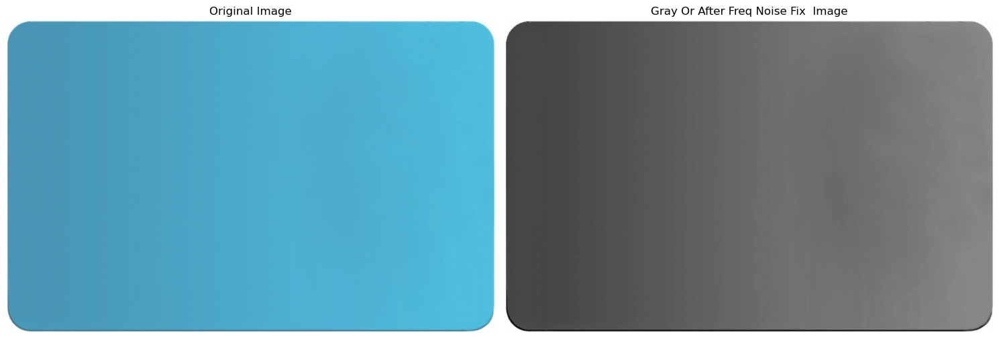

No Salt and Pepper Noise Detected
No rotation detected


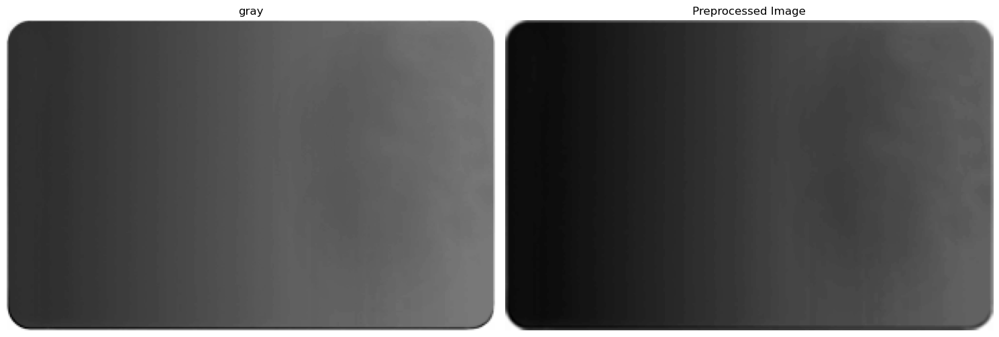

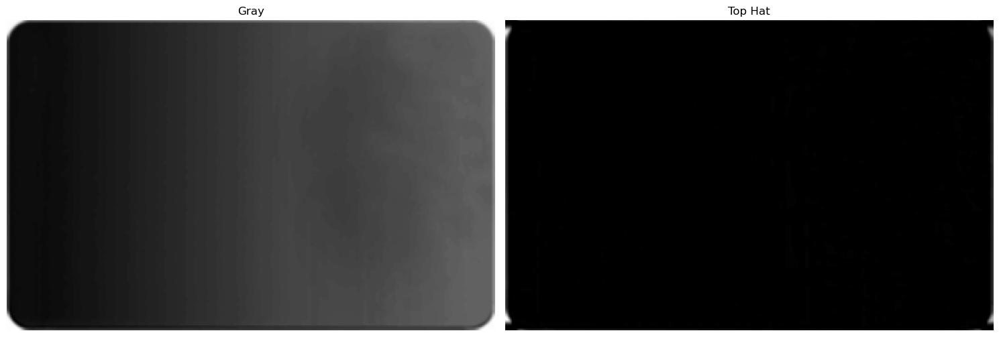

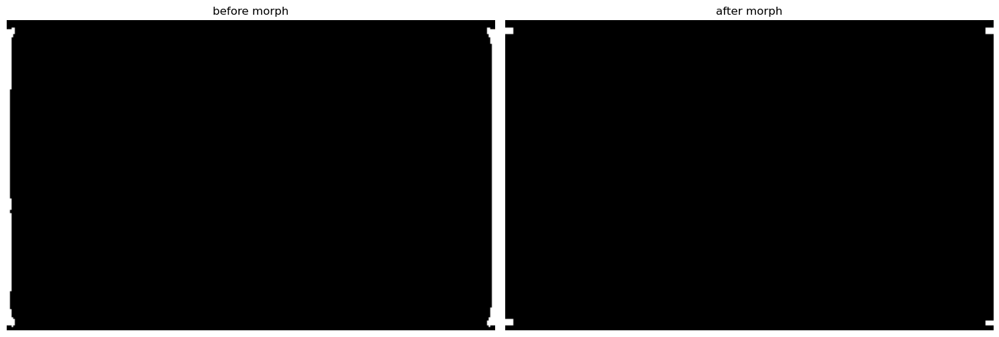

No credit card information found


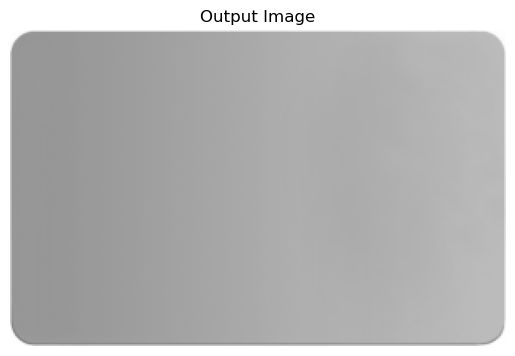

Test Case 2
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (-5, 0) in pixels, Magnitude: 4203253.101599015, Normalized Magnitude: 0.3507, Phase: 0.5570 radians
Frequency: (-5, 3) in pixels, Magnitude: 2019669.352807021, Normalized Magnitude: 0.1685, Phase: -2.8266 radians
Frequency: (-4, -2) in pixels, Magnitude: 2971667.8579542544, Normalized Magnitude: 0.2479, Phase: 0.1577 radians
Frequency: (-4, 0) in pixels, Magnitude: 3637128.3952619564, Normalized Magnitude: 0.3034, Phase: 3.0068 radians
Frequency: (-4, 1) in pixels, Magnitude: 2274541.6728796917, Normalized Magnitude: 0.1898, Phase: 2.9511 radians
Frequency: (-3, -1) in pixels, Magnitude: 3276510.0895566526, Normalized Magnitude: 0.2733, Phase: 2.8070 radians
Frequency: (-3, 2) in pixels, Magnitude: 2263547.2704795003, Normalized Magnitude: 0.1888, Phase: -0.9090 radians
Frequency: (-2, -2) in pixels, Magnitude: 2550044.8062228994, Normalized Magnitude: 0.2127, Phase: 1.9169 radians
Frequency: (-2, 1)

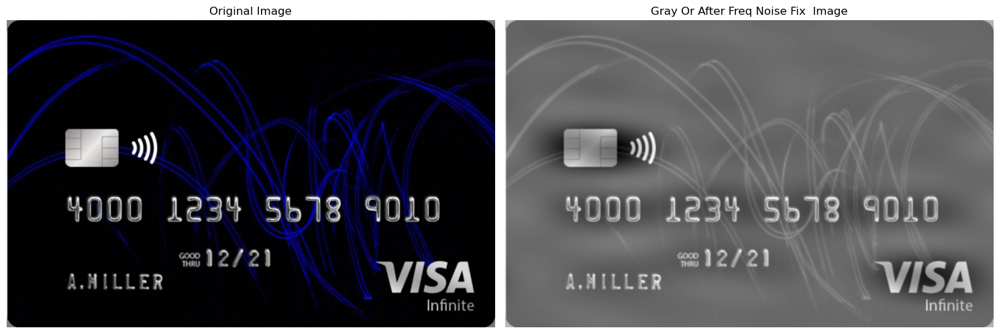

No Salt and Pepper Noise Detected
No rotation detected


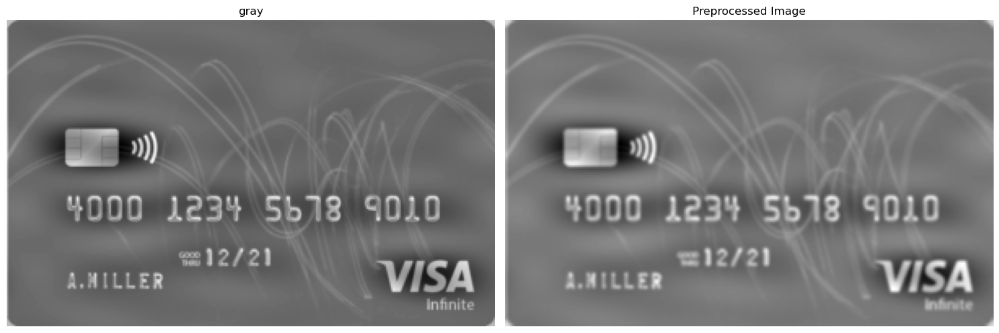

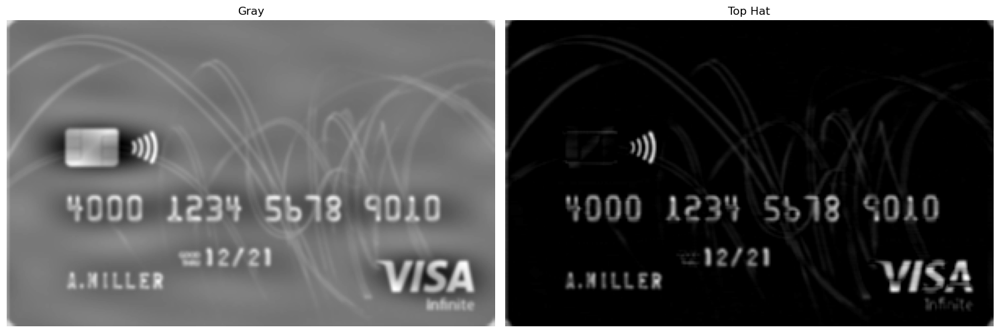

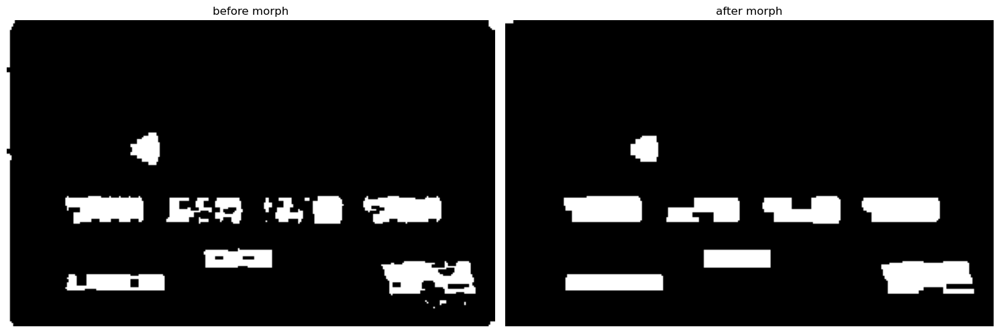

['4', '6', '3', '1', '1', '2', '7']
Credit Card Type: Visa
Credit Card #: 4000123456789010


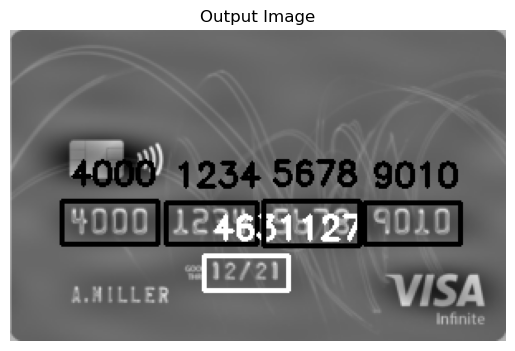

Test Case 3
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 44533071.99999999, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


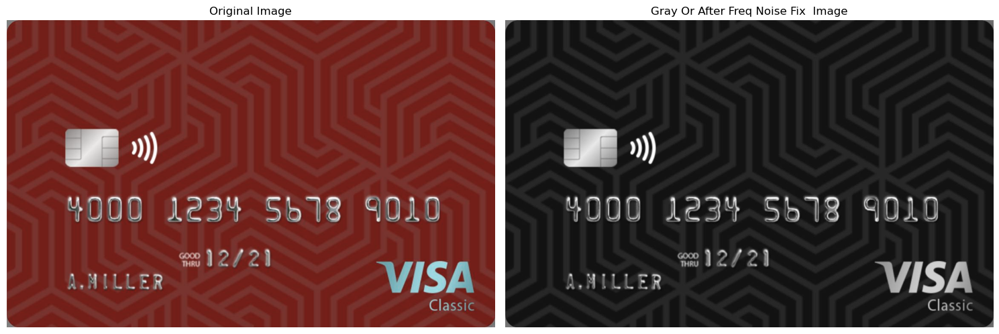

No Salt and Pepper Noise Detected
No rotation detected


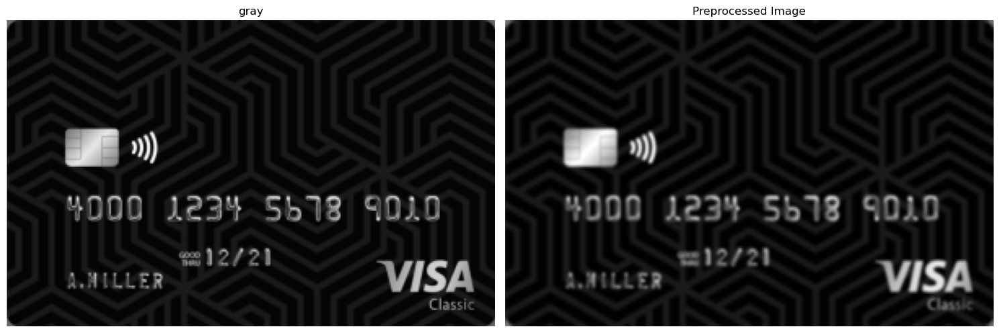

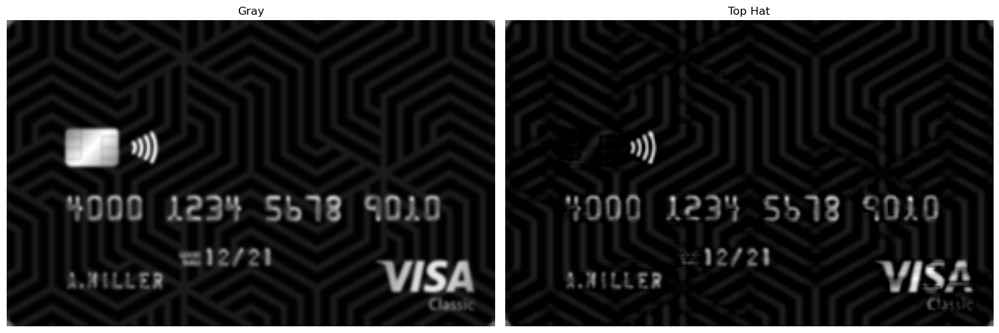

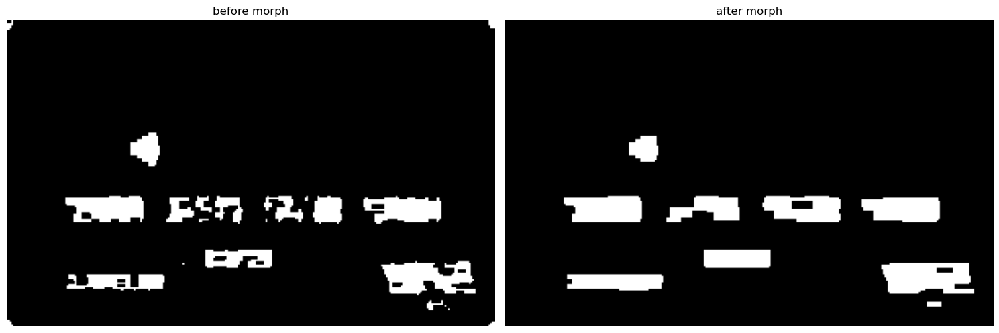

['1', '3', '2', '2', '2', '7']
Credit Card Type: Visa
Credit Card #: 4000123456789010


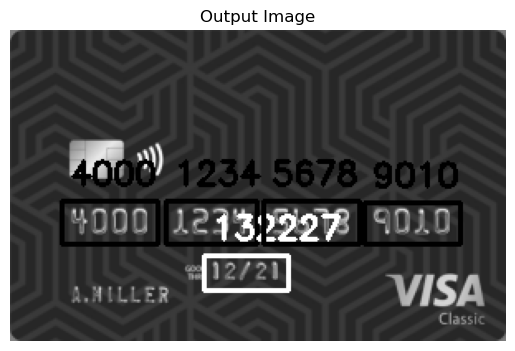

Test Case 4
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, -1) in pixels, Magnitude: 1356441.7590033219, Normalized Magnitude: 0.1690, Phase: -0.1939 radians
Frequency: (0, 0) in pixels, Magnitude: 8025900.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
Frequency: (0, 1) in pixels, Magnitude: 1356441.7590033219, Normalized Magnitude: 0.1690, Phase: 0.1939 radians
No significant sinusoidal frequency detected. Skipping noise removal.


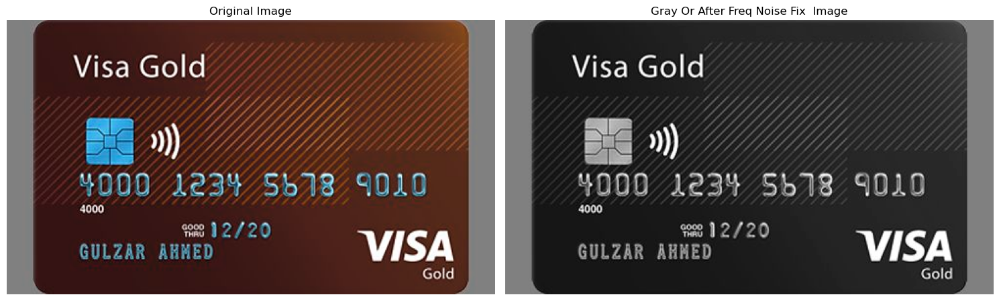

No Salt and Pepper Noise Detected
No rotation detected


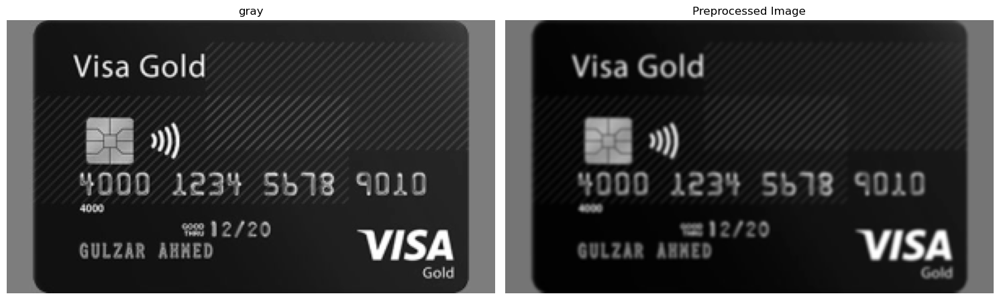

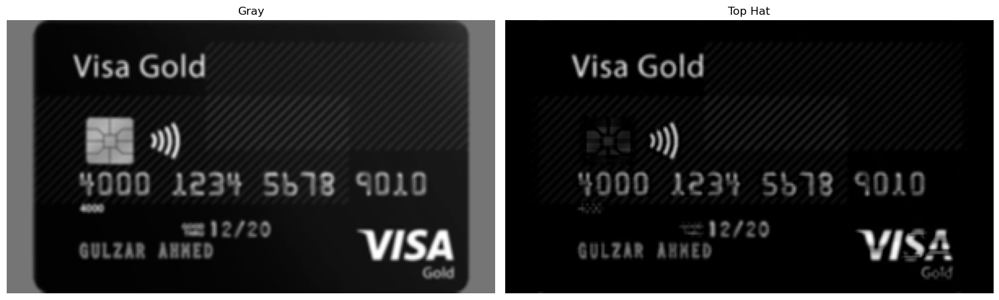

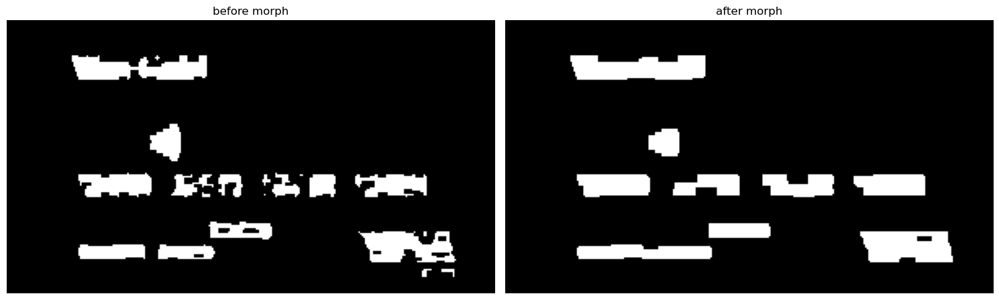

Credit Card Type: Visa
Credit Card #: 4000123456789010


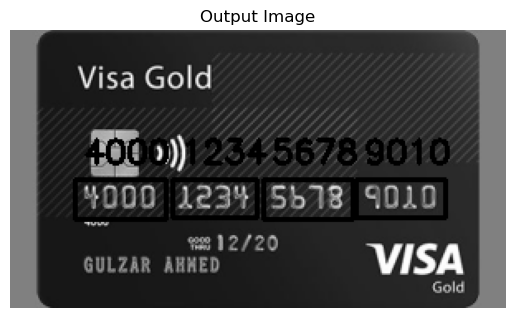

Test Case 5
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 18974783.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


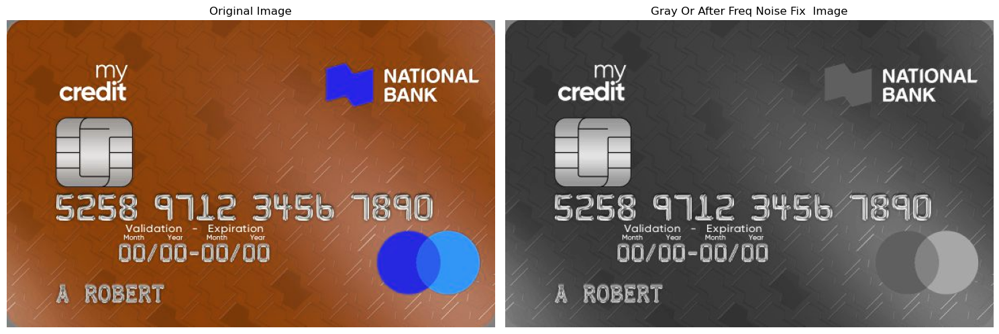

No Salt and Pepper Noise Detected
No rotation detected


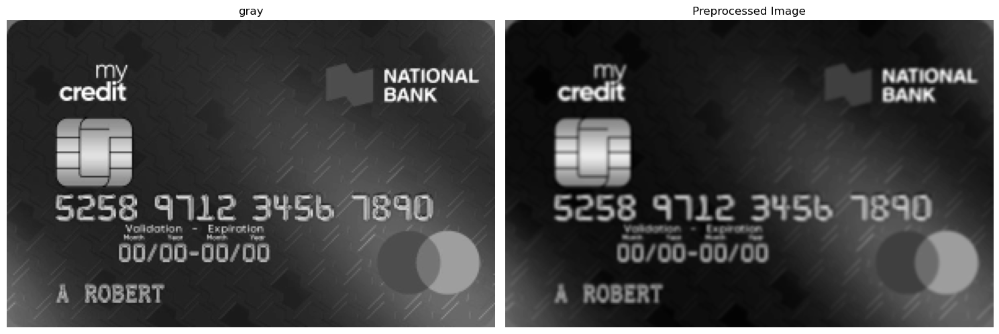

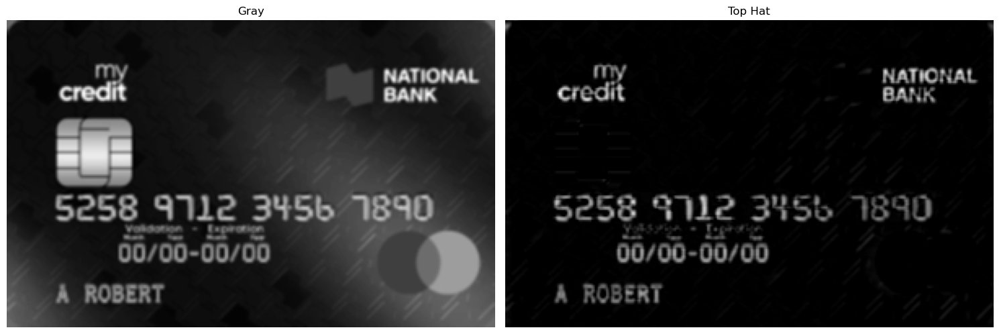

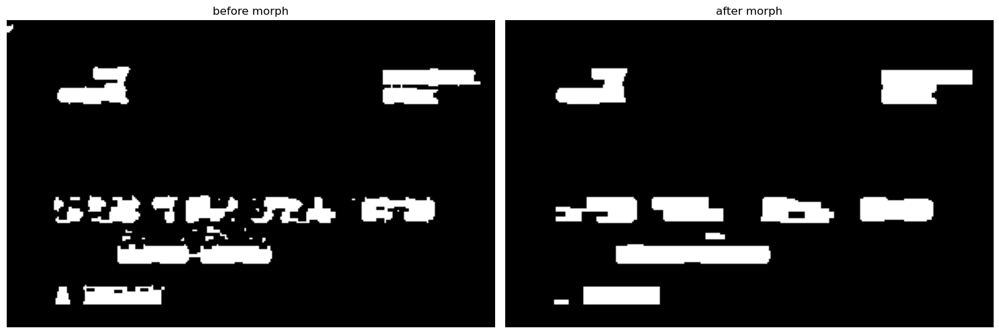

Credit Card Type: MasterCard
Credit Card #: 5258971234567890


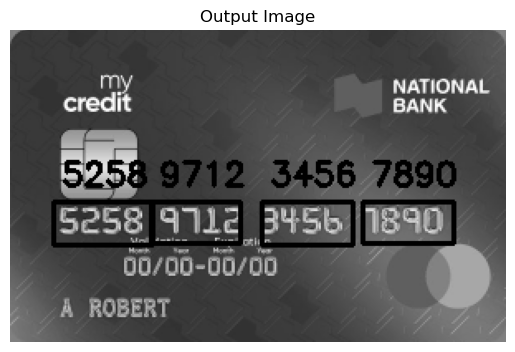

Test Case 6
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 310098754.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


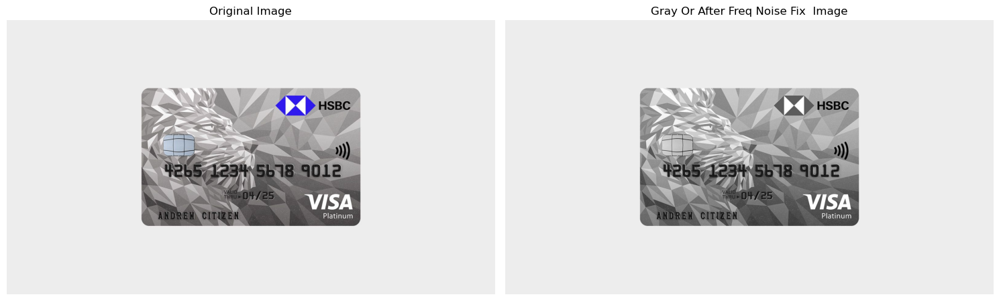

No Salt and Pepper Noise Detected
No rotation detected


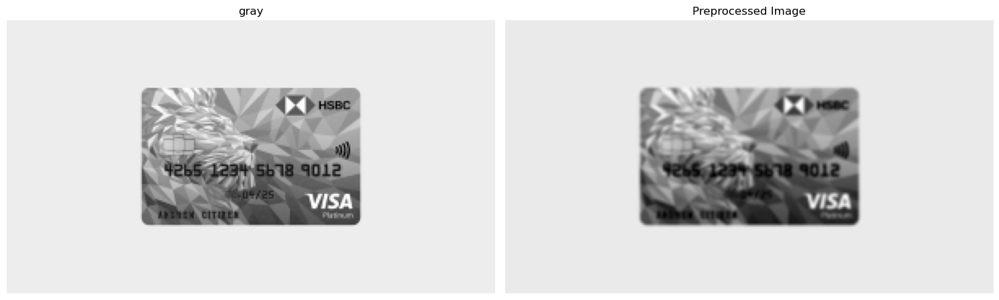

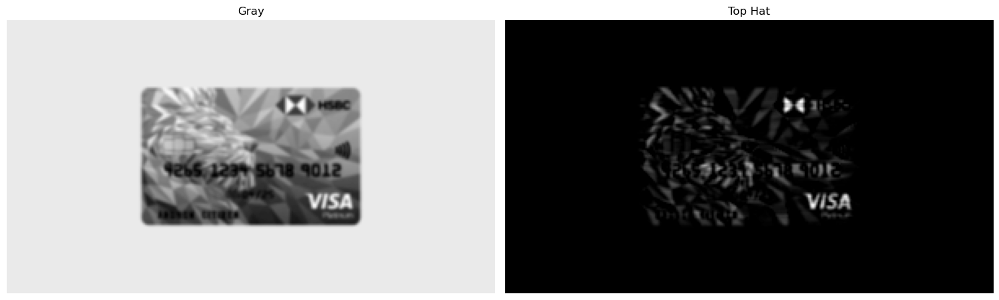

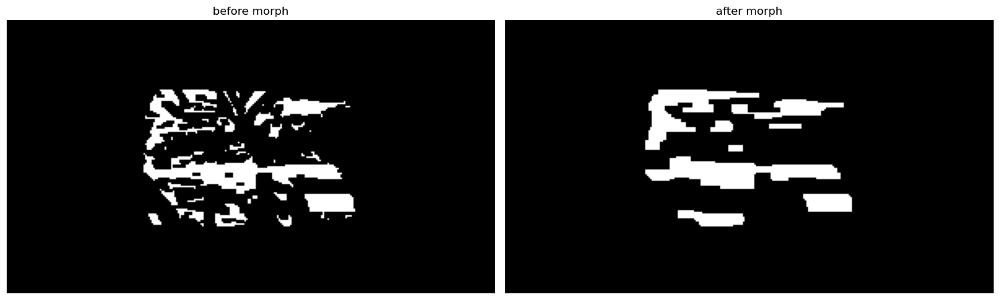

No credit card information found


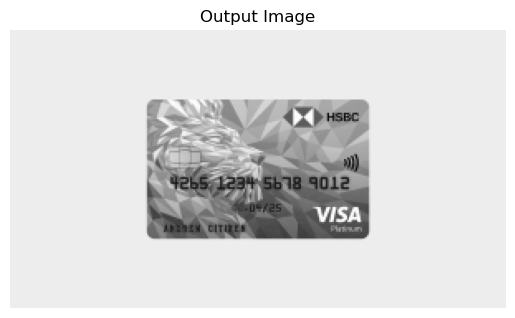

Test Case 7
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (-1, 0) in pixels, Magnitude: 110723983.19718595, Normalized Magnitude: 0.2919, Phase: 0.1946 radians
Frequency: (0, 0) in pixels, Magnitude: 379261963.99999994, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
Frequency: (1, 0) in pixels, Magnitude: 110723983.19718595, Normalized Magnitude: 0.2919, Phase: -0.1946 radians
No significant sinusoidal frequency detected. Skipping noise removal.


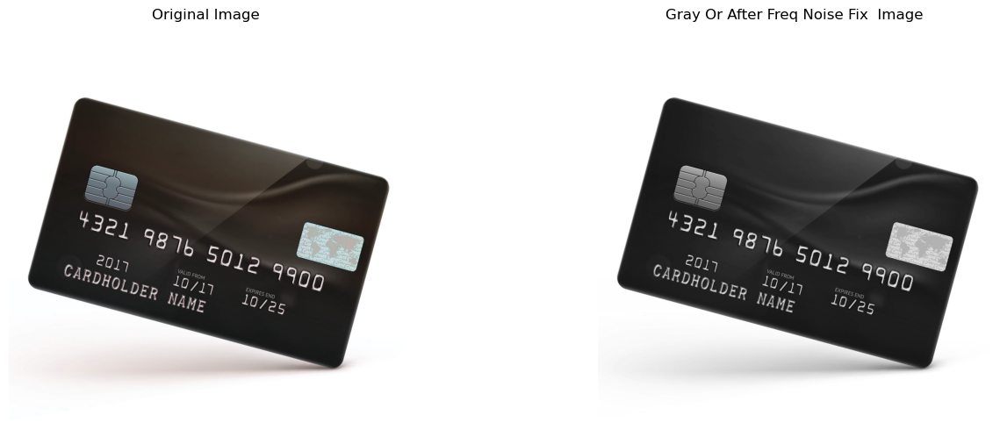

No Salt and Pepper Noise Detected
Correcting rotation...


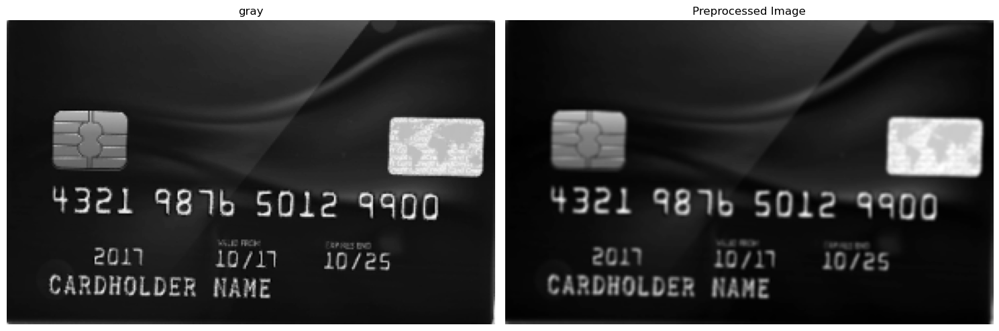

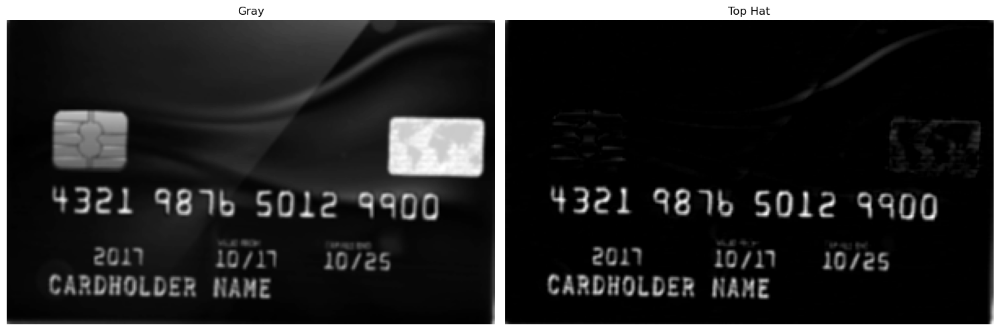

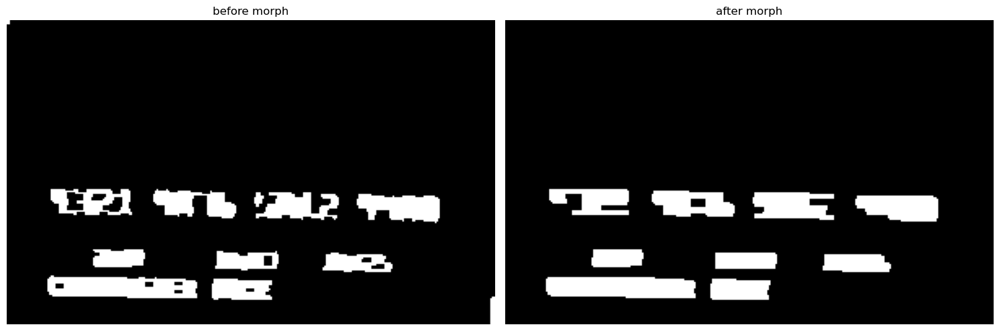

['1', '0', '0', '0', '1', '0', '2', '5']
Credit Card Type: Visa
Credit Card #: 4321987650129900


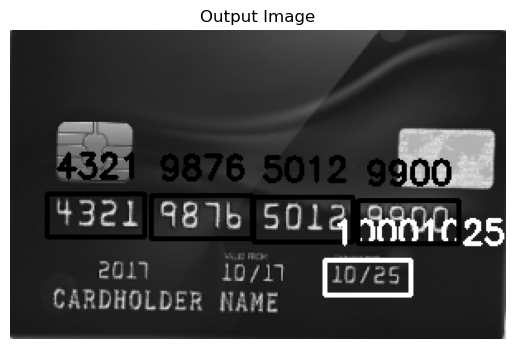

Test Case 8
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (-1, 0) in pixels, Magnitude: 5519544.934011606, Normalized Magnitude: 0.1964, Phase: 0.0319 radians
Frequency: (0, 0) in pixels, Magnitude: 28099926.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
Frequency: (1, 0) in pixels, Magnitude: 5519544.934011606, Normalized Magnitude: 0.1964, Phase: -0.0319 radians
No significant sinusoidal frequency detected. Skipping noise removal.


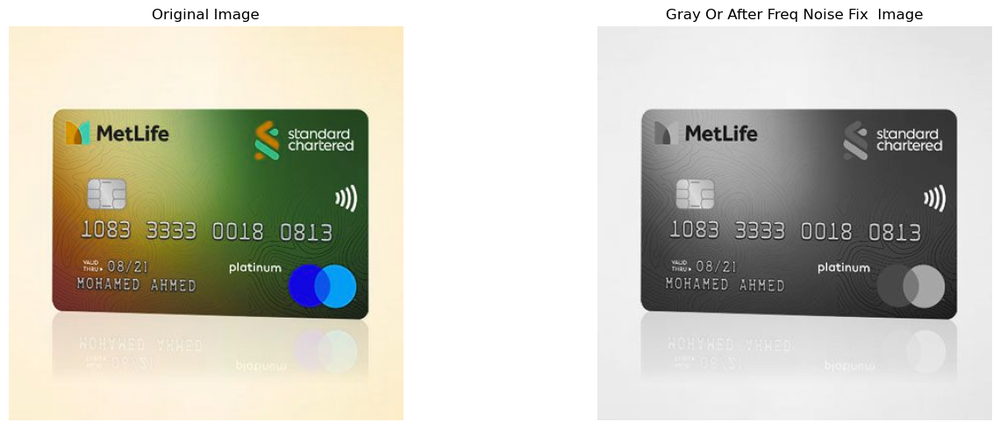

No Salt and Pepper Noise Detected
No rotation detected


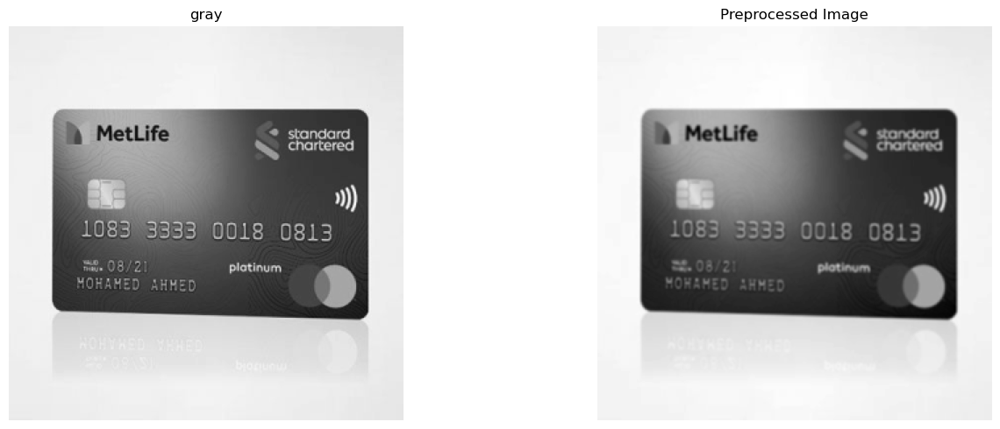

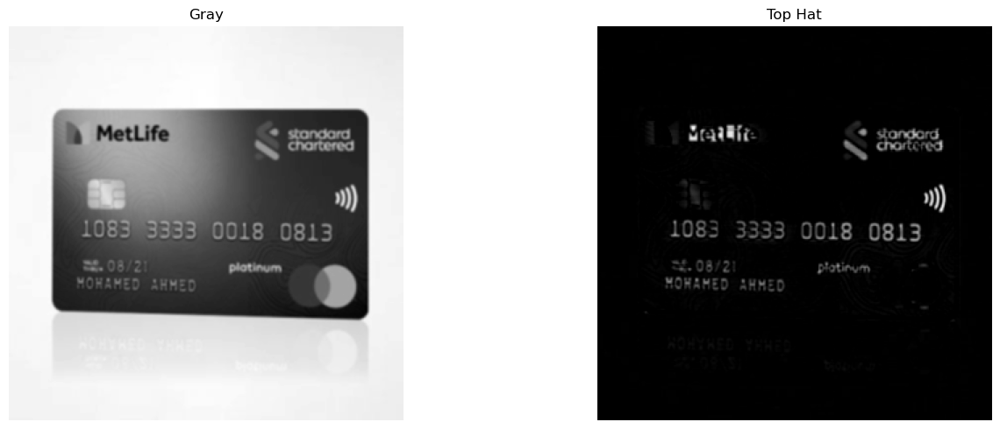

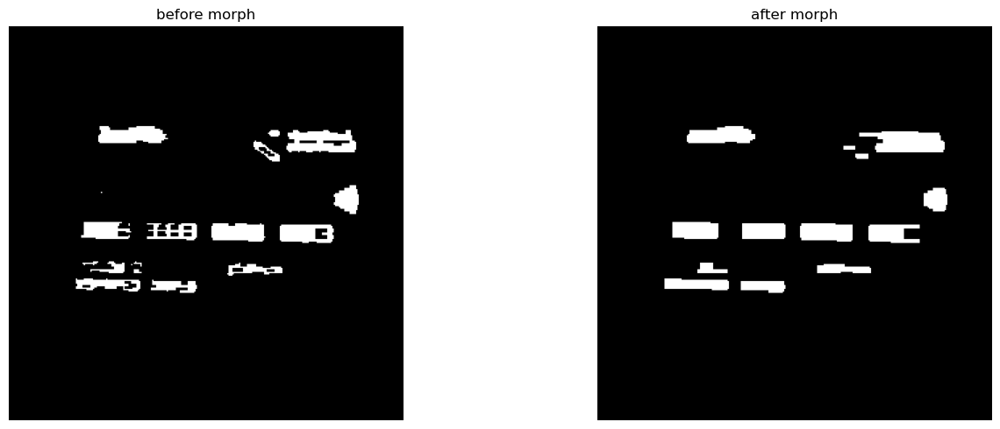

No credit card information found


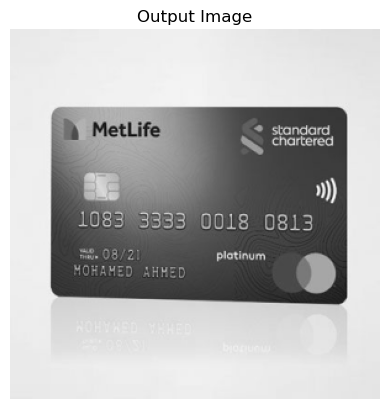

Test Case 9
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 183724386.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


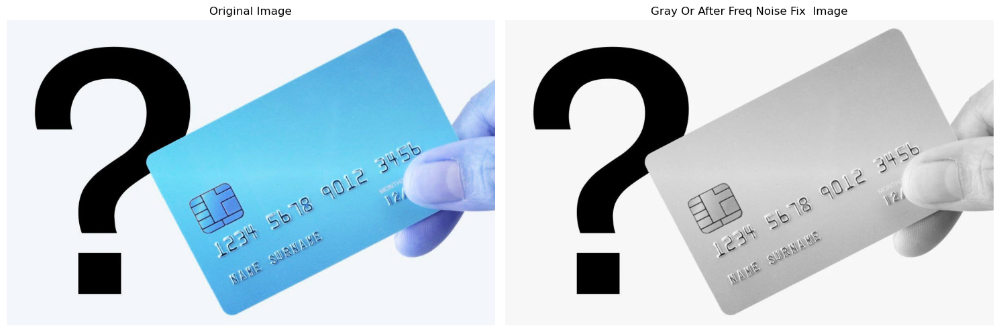

No Salt and Pepper Noise Detected
No rotation detected


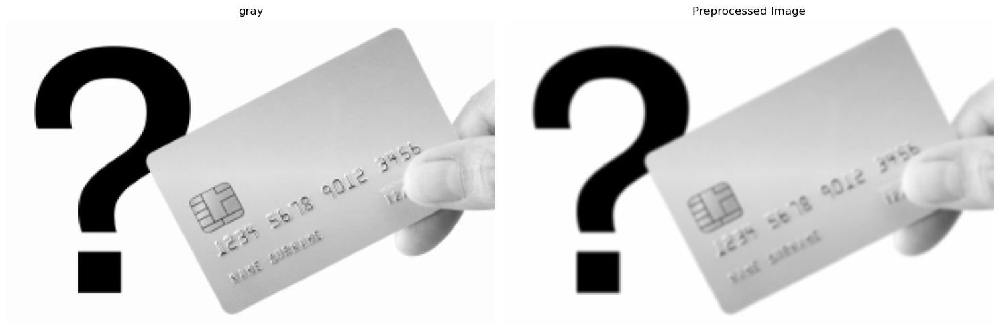

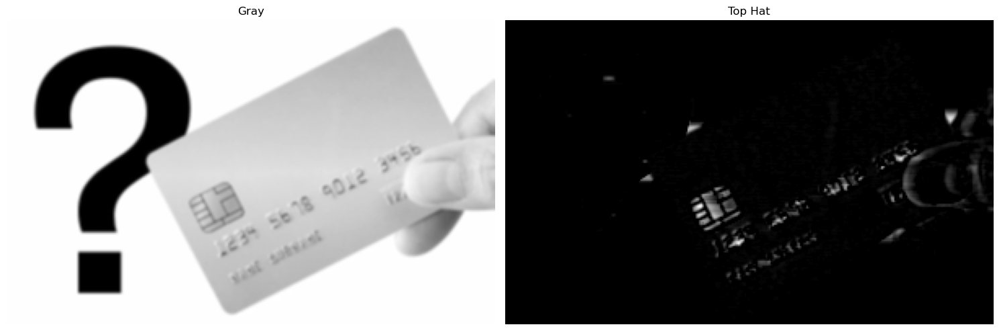

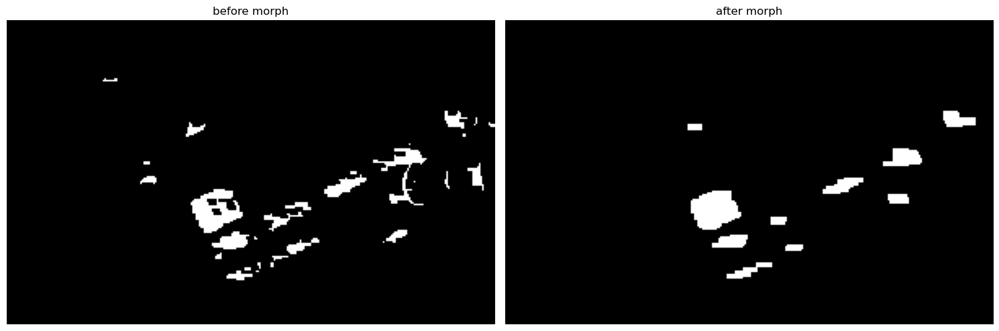

No credit card information found


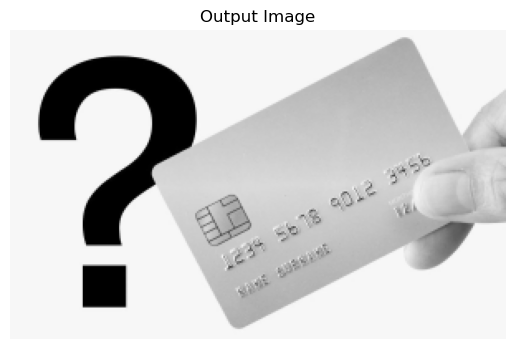

Test Case 10
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 94378224.0, Normalized Magnitude: 1.0000, Phase: -0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


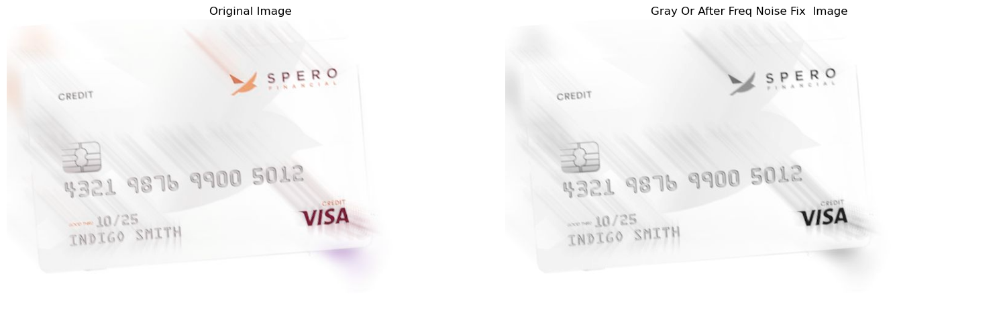

No Salt and Pepper Noise Detected
No rotation detected


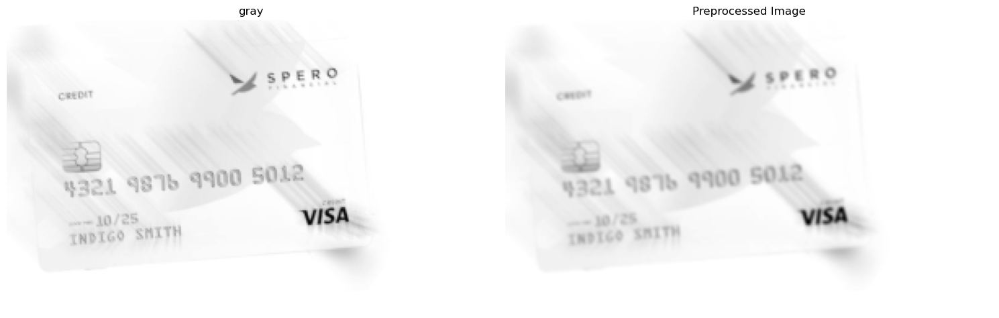

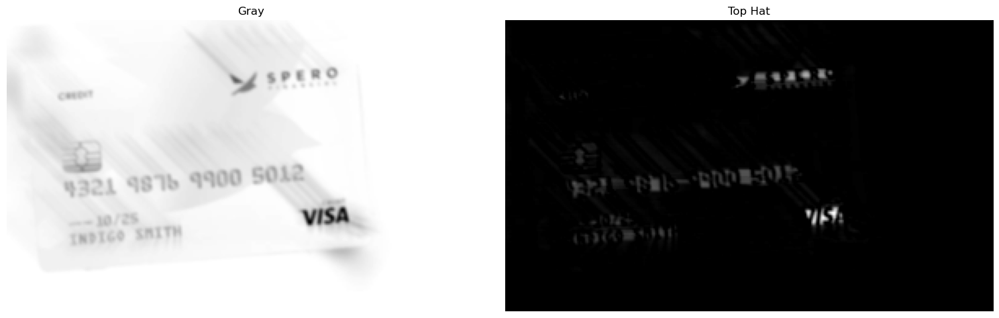

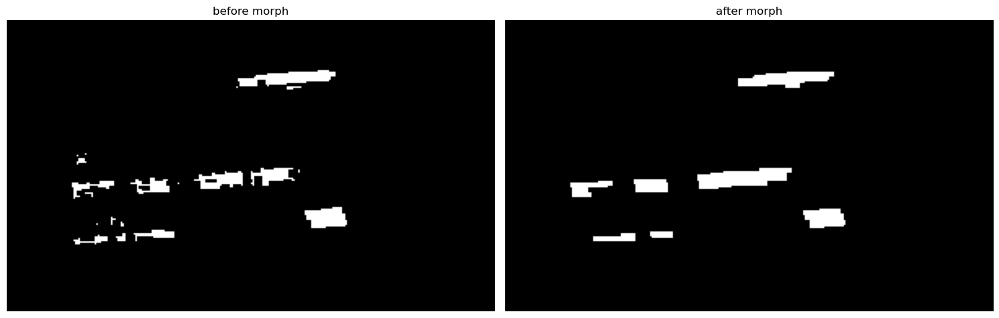

No credit card information found


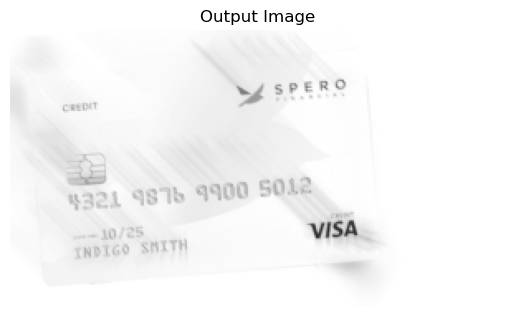

Test Case 11
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 3707606.9999999995, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


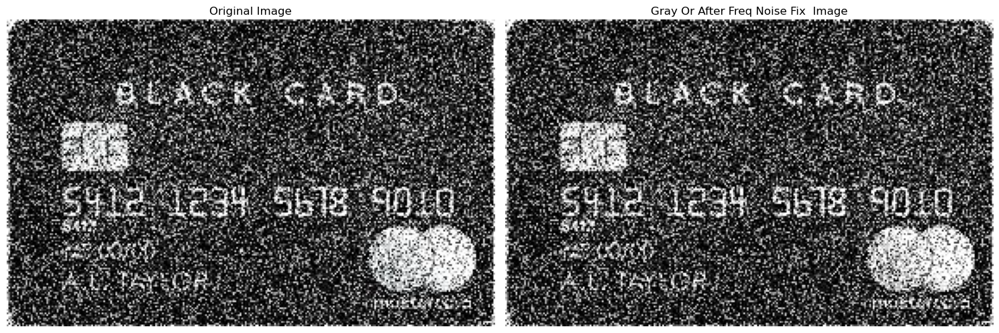

No rotation detected


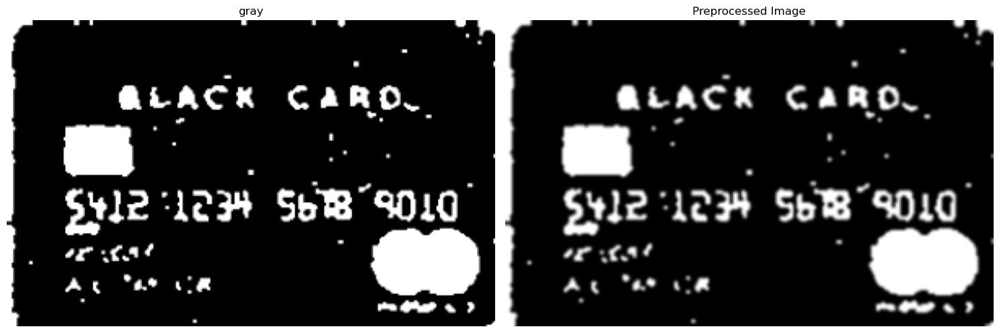

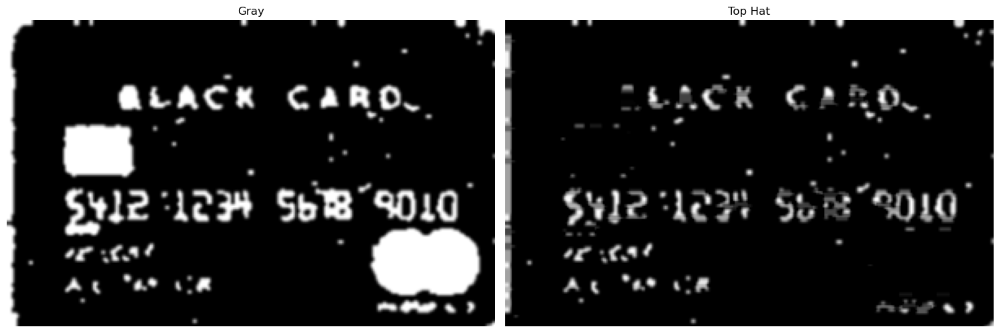

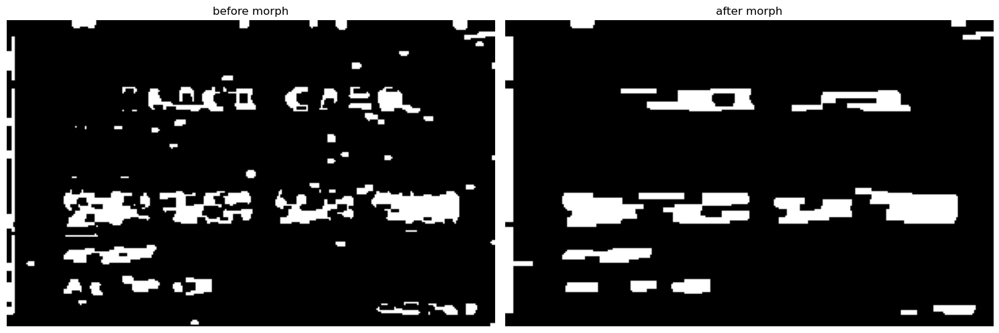

['4', '0', '1', '6', '7', '3']
Credit Card Type: Unknown
Credit Card #: 9677


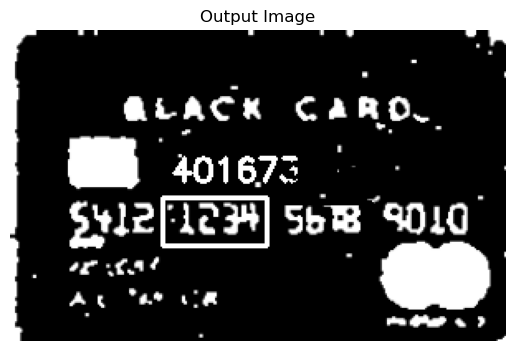

Test Case 12
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (-1, 0) in pixels, Magnitude: 6708764.975008054, Normalized Magnitude: 0.1810, Phase: -0.1522 radians
Frequency: (0, 0) in pixels, Magnitude: 37060037.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
Frequency: (1, 0) in pixels, Magnitude: 6708764.975008054, Normalized Magnitude: 0.1810, Phase: 0.1522 radians
No significant sinusoidal frequency detected. Skipping noise removal.


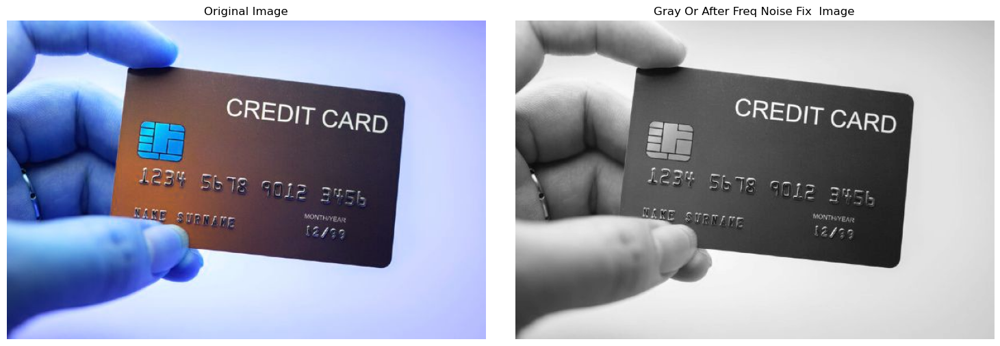

No Salt and Pepper Noise Detected
No rotation detected


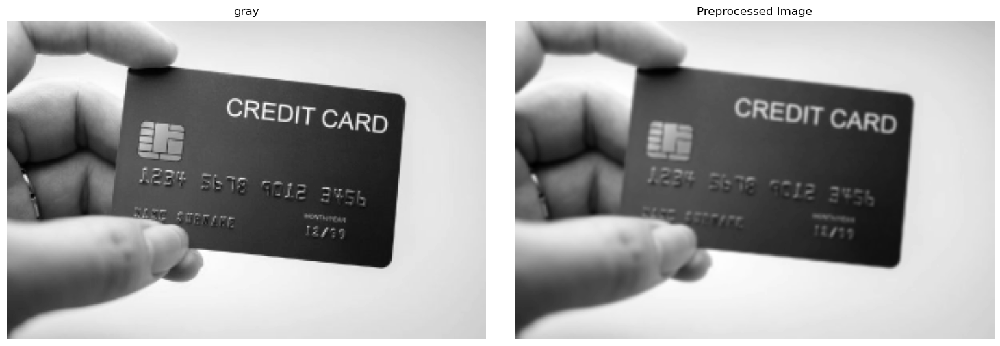

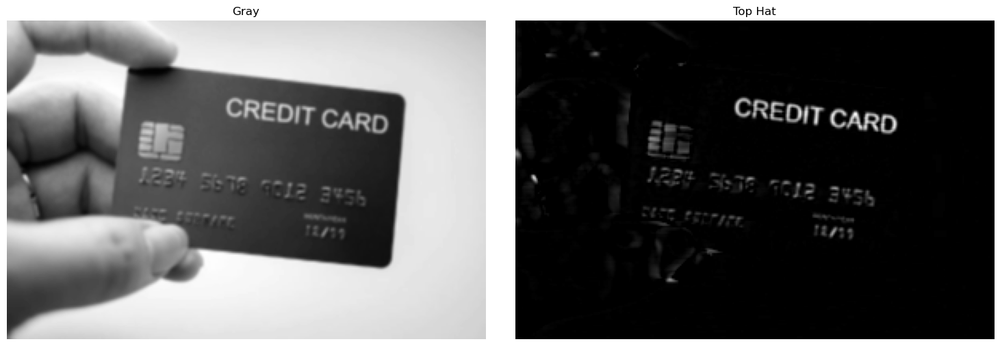

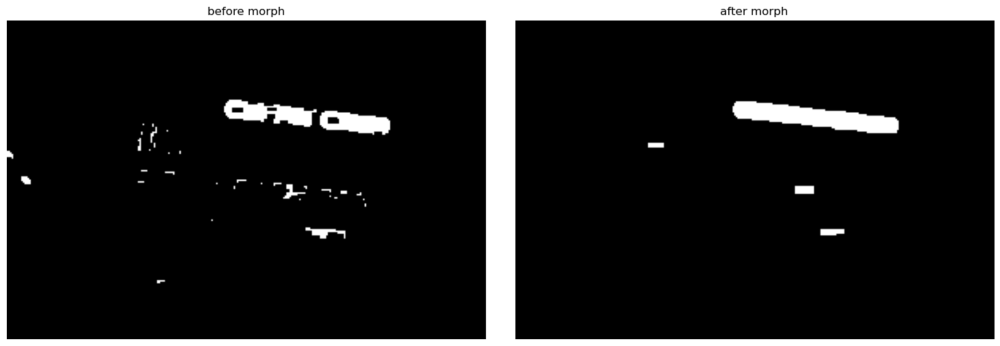

No credit card information found


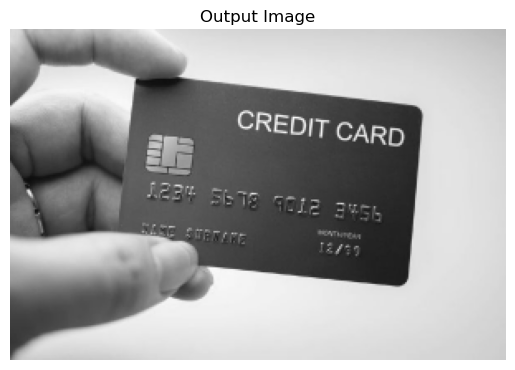

Test Case 13
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (-1, 0) in pixels, Magnitude: 3198811.3366291826, Normalized Magnitude: 0.1596, Phase: 0.0935 radians
Frequency: (0, -6) in pixels, Magnitude: 4175260.188055228, Normalized Magnitude: 0.2083, Phase: 1.8866 radians
Frequency: (0, 0) in pixels, Magnitude: 20040588.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
Frequency: (0, 6) in pixels, Magnitude: 4175260.188055228, Normalized Magnitude: 0.2083, Phase: -1.8866 radians
Frequency: (1, 0) in pixels, Magnitude: 3198811.336629183, Normalized Magnitude: 0.1596, Phase: -0.0935 radians
Removing frequency: (0, -6)
Removing frequency: (0, 6)


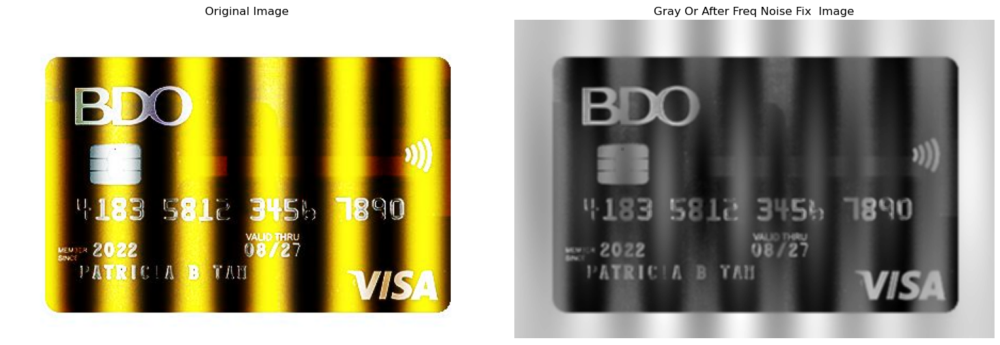

No Salt and Pepper Noise Detected
No rotation detected


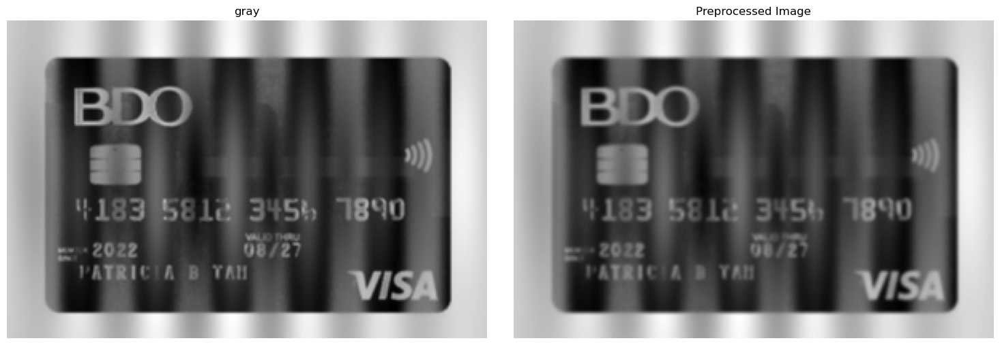

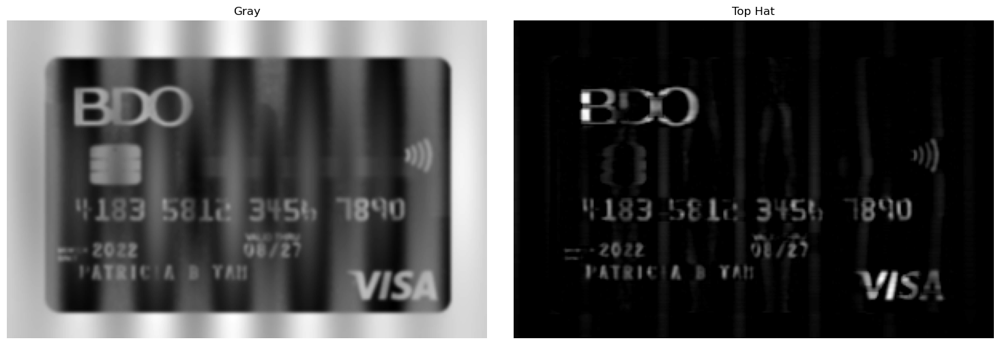

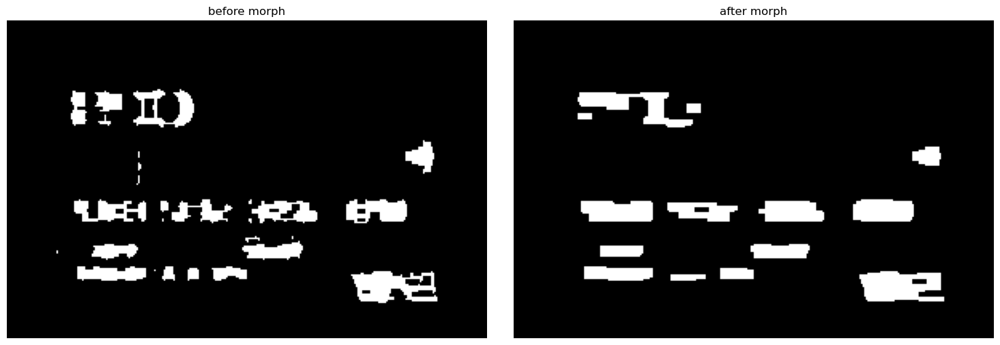

['4', '7', '1', '8', '9']
['3', '4', '4']
['6', '1', '1']
Credit Card Type: Discover Card
Credit Card #: 6611


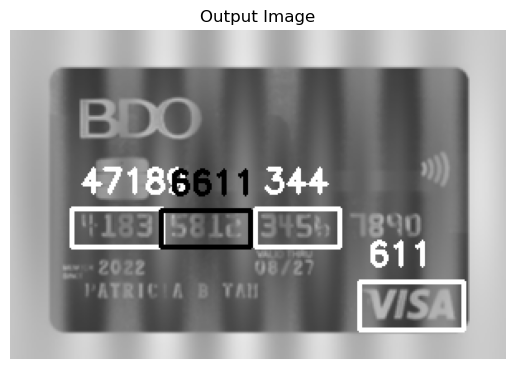

Test Case 14
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 31229657.999999996, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


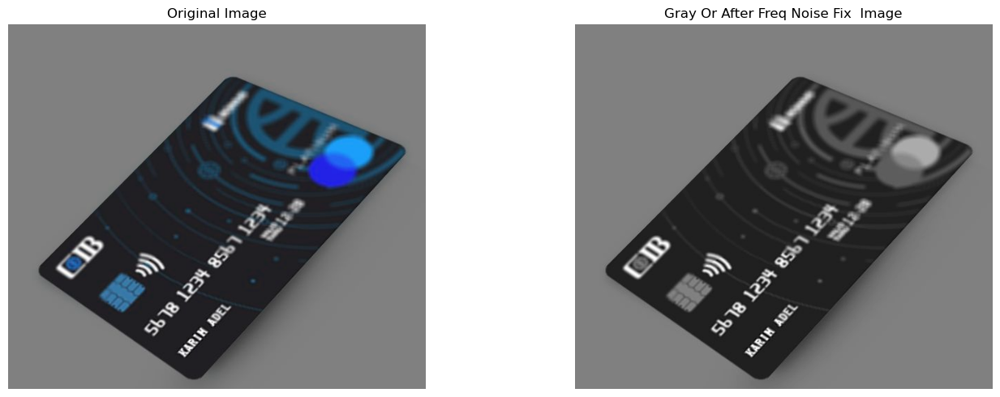

No Salt and Pepper Noise Detected
Correcting rotation...


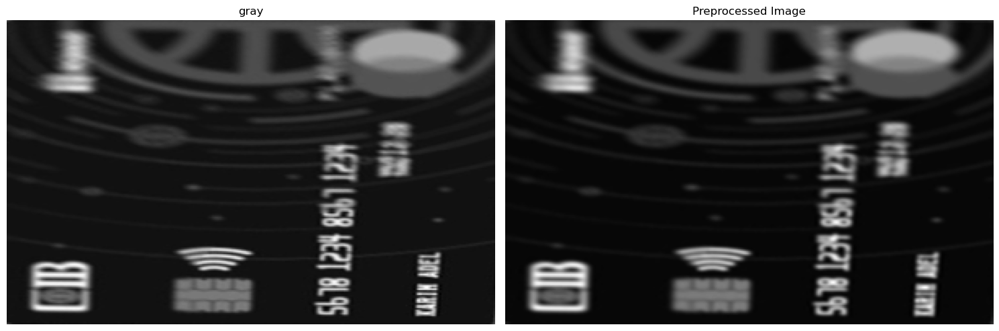

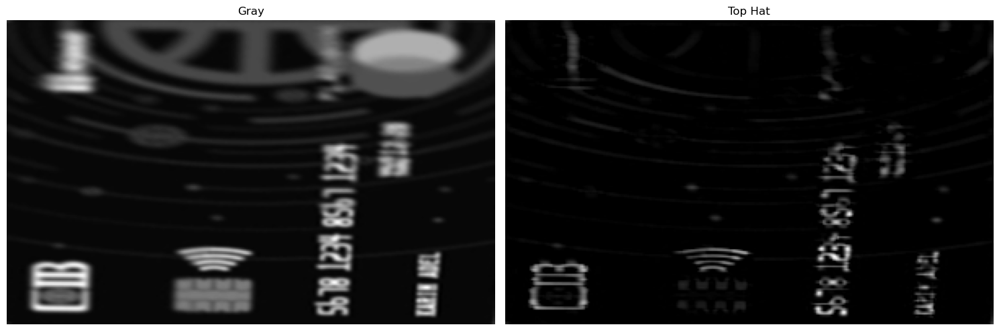

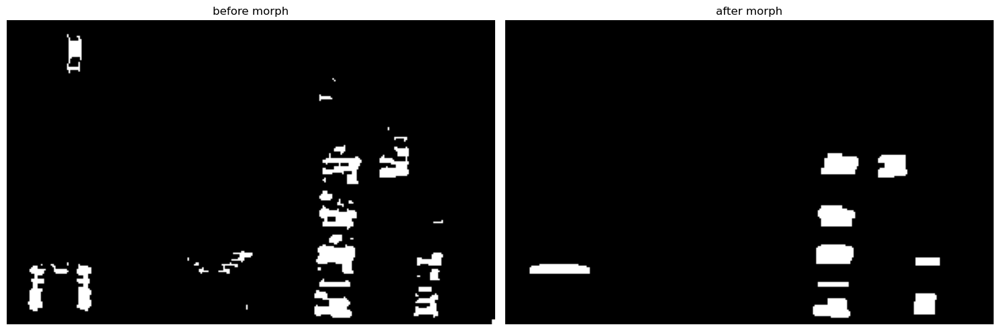

No credit card information found


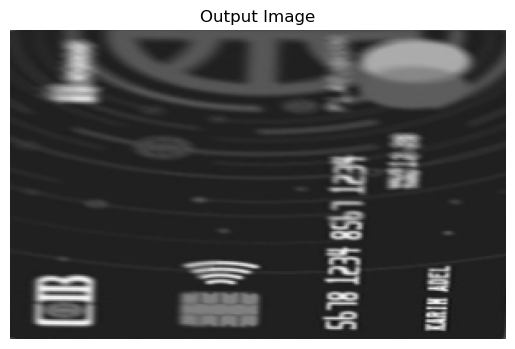

Test Case 15
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (-3, -1) in pixels, Magnitude: 62242.084538616386, Normalized Magnitude: 0.1696, Phase: -3.0490 radians
Frequency: (-2, 0) in pixels, Magnitude: 65681.24174639686, Normalized Magnitude: 0.1789, Phase: -1.1417 radians
Frequency: (-1, -1) in pixels, Magnitude: 125697.91097643283, Normalized Magnitude: 0.3424, Phase: -0.9219 radians
Frequency: (-1, 0) in pixels, Magnitude: 129890.47074091378, Normalized Magnitude: 0.3538, Phase: -2.6192 radians
Frequency: (-1, 1) in pixels, Magnitude: 101227.12663154324, Normalized Magnitude: 0.2758, Phase: 0.5547 radians
Frequency: (0, -3) in pixels, Magnitude: 63563.03879538117, Normalized Magnitude: 0.1732, Phase: -2.1888 radians
Frequency: (0, -2) in pixels, Magnitude: 59598.006085755966, Normalized Magnitude: 0.1624, Phase: -1.0847 radians
Frequency: (0, -1) in pixels, Magnitude: 86334.17205775002, Normalized Magnitude: 0.2352, Phase: 2.8983 radians
Frequency: (0, 

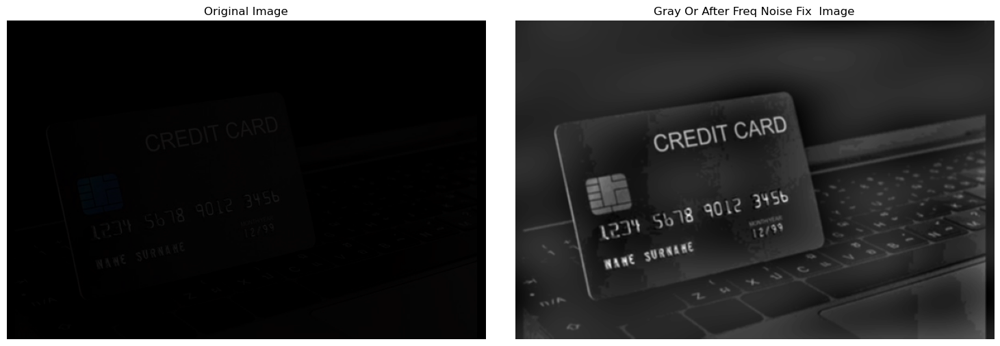

No Salt and Pepper Noise Detected
No rotation detected


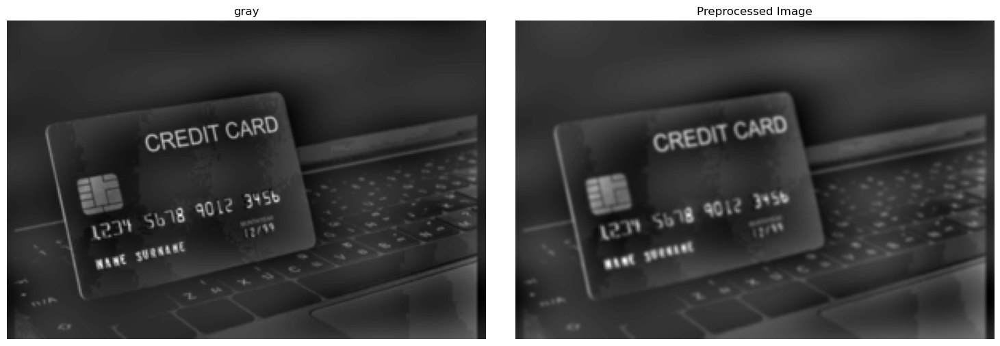

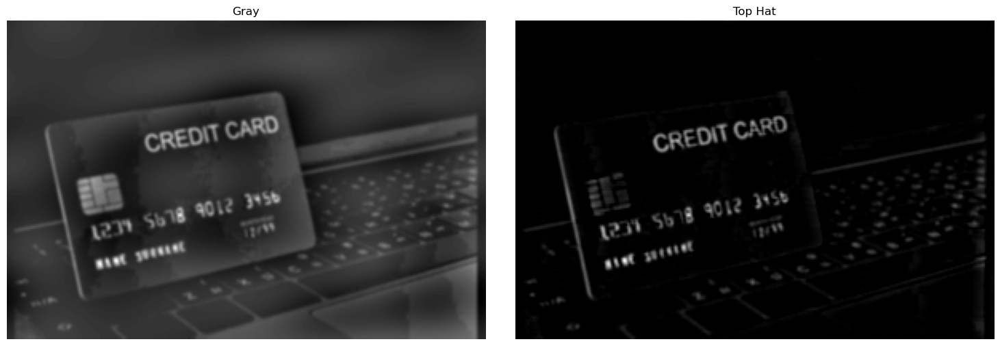

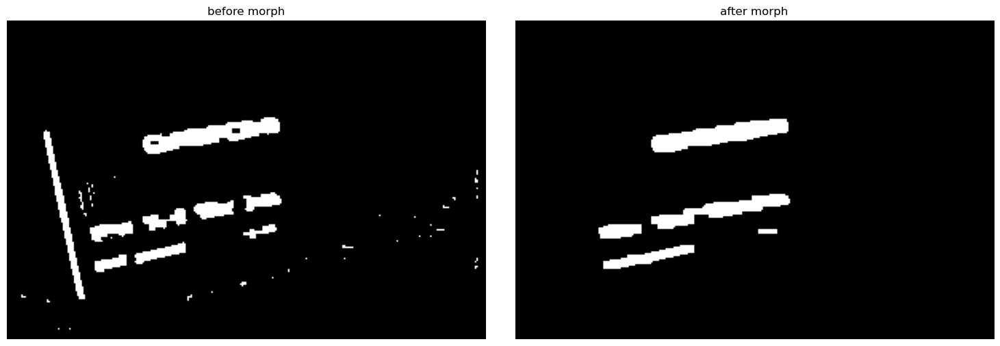

No credit card information found


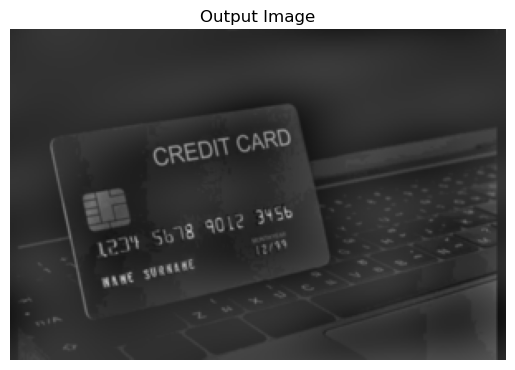

Test Case 16
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 19043236.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


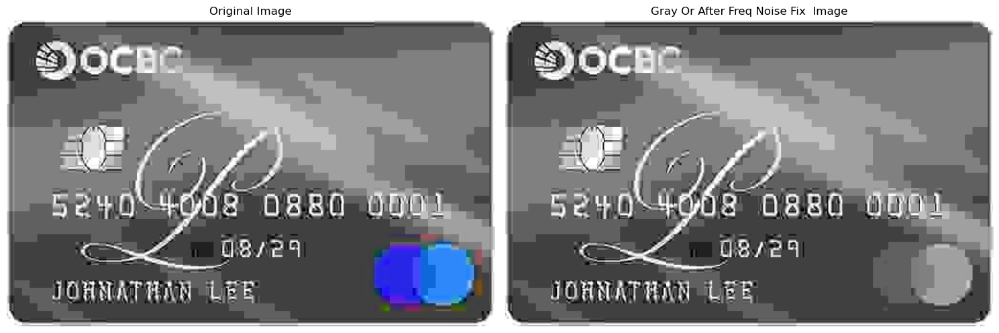

No Salt and Pepper Noise Detected
No rotation detected


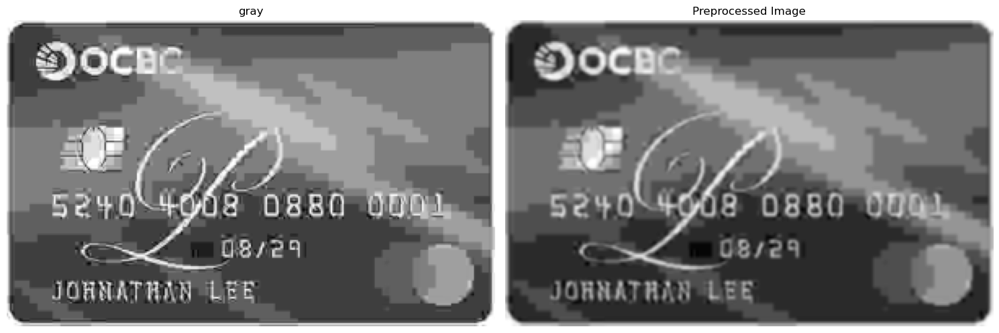

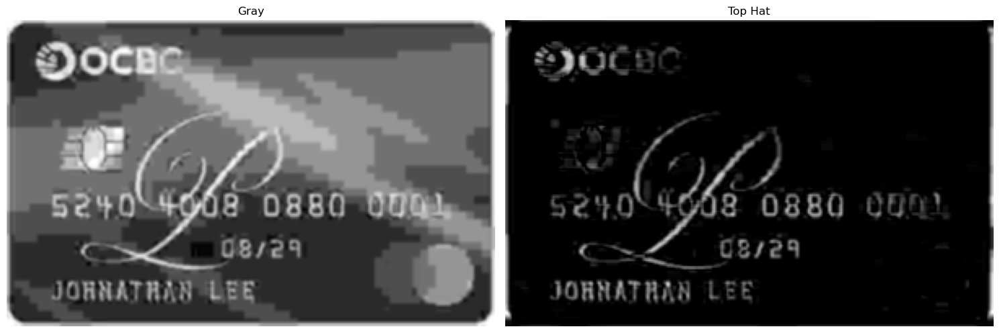

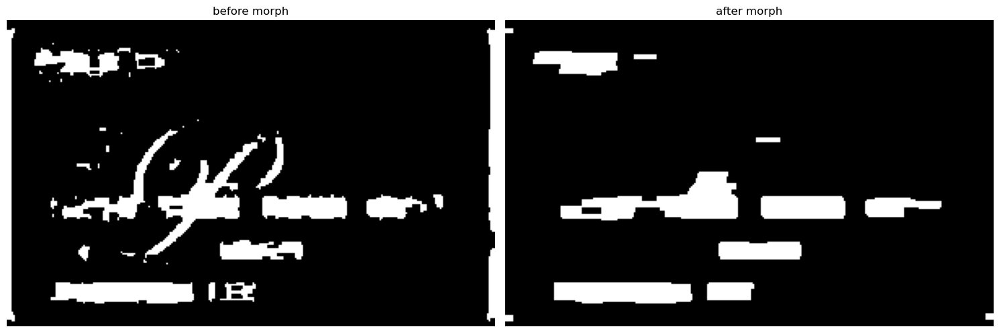

['0', '0', '8', '8', '1', '0']
['4']
Credit Card Type: Unknown
Credit Card #: 0469


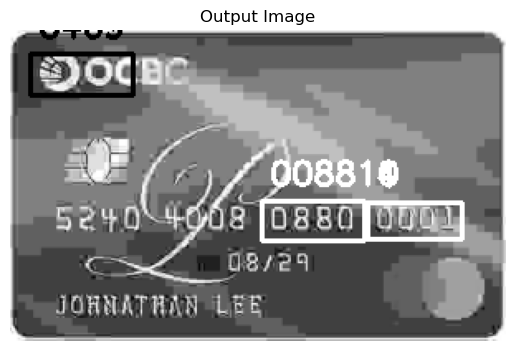

Test Case 17
Detected sinusoidal noise frequencies, magnitudes, and phases:
Frequency: (0, 0) in pixels, Magnitude: 23883243.0, Normalized Magnitude: 1.0000, Phase: 0.0000 radians
No significant sinusoidal frequency detected. Skipping noise removal.


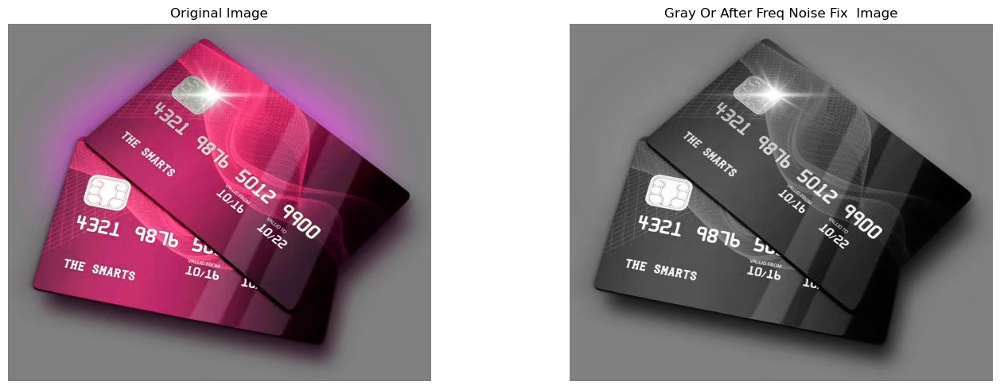

No Salt and Pepper Noise Detected
Correcting rotation...


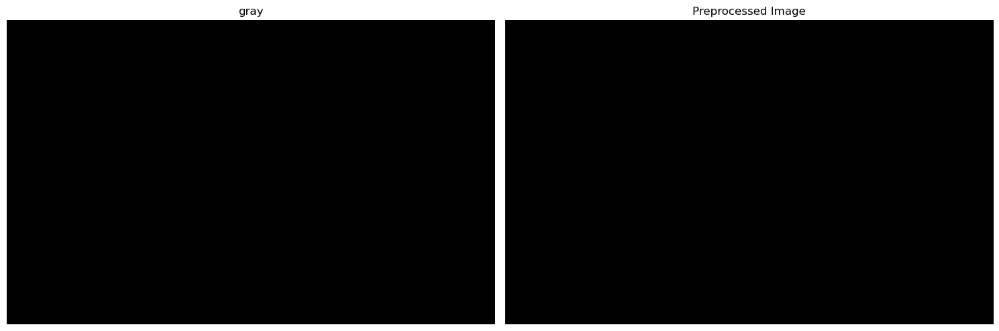

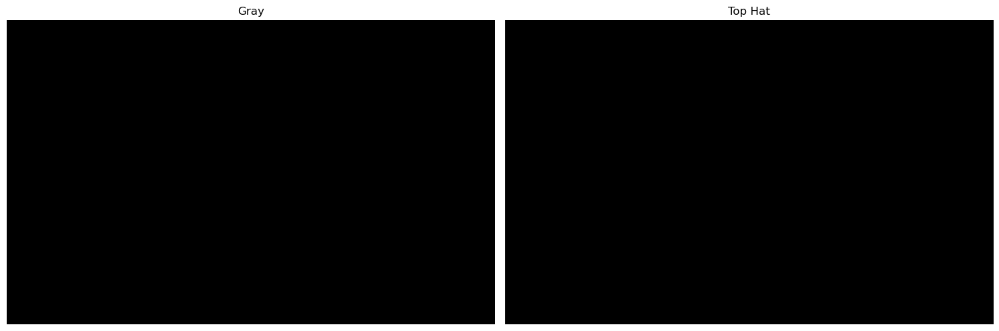

C:\Users\moisi\AppData\Local\Temp\ipykernel_4752\1475588874.py:14: RuntimeWarning: invalid value encountered in divide
  gradX = (255 * ((gradX - minVal) / (maxVal - minVal))).astype("uint8")
C:\Users\moisi\AppData\Local\Temp\ipykernel_4752\1475588874.py:14: RuntimeWarning: invalid value encountered in cast
  gradX = (255 * ((gradX - minVal) / (maxVal - minVal))).astype("uint8")


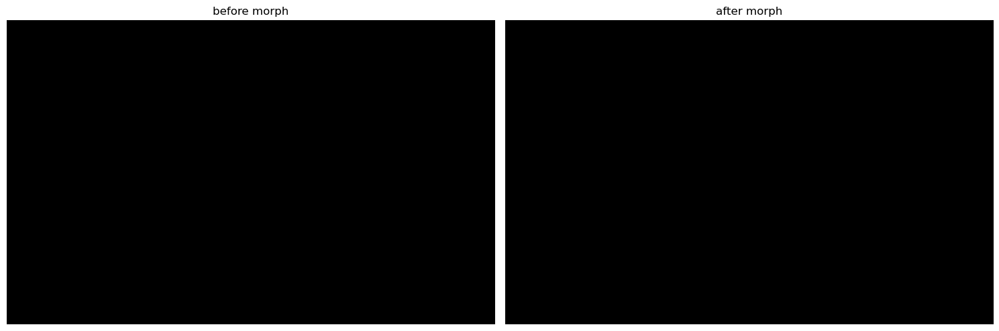

No credit card information found


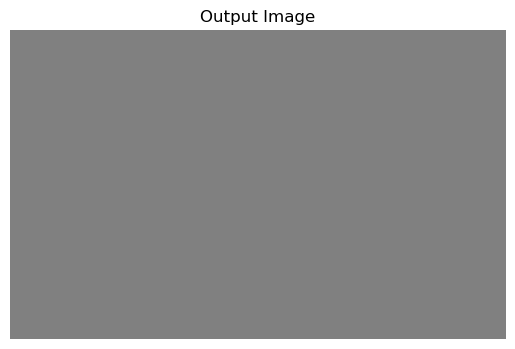

In [19]:
ref_image_path = 'ref/ocr_a_reference.png'
digits = load_digit_templates(ref_image_path)
for i in range(len(testcases)  ):
# for i in range(1):
    print(f'Test Case {i+1}')
    image = cv2.imread(testcases[i])
    # image = cv2.imread('testpys/median_filtered_image.jpg')
    # image = cv2.imread('testpys/output.jpg')
    # image = cv2.imread('testpys/wraped.jpg')
    # image = cv2.imread('testpys/processed_for_extraction.jpg')
    # image = cv2.imread('testpys/filtered_image.jpg')
    # image = cv2.imread('testcases/10 - Mal7 w Felfel.jpg')
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


    gray , sineflag = detect_and_remove_sin_noise(gray)
    
    
    show_images([image, gray], ['Original Image', 'Gray Or After Freq Noise Fix  Image'])
    
    
    if detect_salt_pepper_noise(gray) == "Salt and Pepper Noise Detected":
        gray = fix_salt_pepper_noise(gray)
    else:
        print("No Salt and Pepper Noise Detected")
        

    # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges_output = cv2.Canny(gray, 50, 150, apertureSize=3)
    is_tilted, angle = Check_Rotation(edges_output)
    if is_tilted:
        print("Correcting rotation...")
        gray = correct_rotation(edges_output, gray)
    else:
        print("No rotation detected")


    gray = imutils.resize(gray, width=300) 
    # gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    proceed_image = preprocess_image(gray)
    thresh = apply_morphological_operations(proceed_image)
    locs = find_digit_contours(thresh)
    output = recognize_digits(gray, proceed_image, locs, digits, EXPECTED_PAN_DIGITS)

    display_results(output, gray)

